# **IMAGECHD DATASET - EXPLORATORY DATA ANALYSIS**

# **Mount Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Check And Extract the data from folders**

In [ ]:
import os
path = '/content/drive/MyDrive/ImageCHD'
print(os.listdir(path))

['ImageCHD_dataset.z09', 'ImageCHD_dataset.z01', 'ImageCHD_dataset.z02', 'ImageCHD_dataset.z03', 'ImageCHD_dataset.z05', 'ImageCHD_dataset.z06', 'ImageCHD_dataset.z11', 'ImageCHD_dataset.z04', 'ImageCHD_dataset.z07', 'ImageCHD_dataset.z08', 'ImageCHD_dataset.z10', 'ImageCHD_dataset.zip', 'ImageCHD_dataset.z12', 'segresnet_checkpoints', 'predictions']


In [ ]:
!apt-get install p7zip-full -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 53 not upgraded.


**Extract Dataset (7z)**

In [ ]:
!7z x '/content/drive/MyDrive/ImageCHD/ImageCHD_dataset.zip' \
    -o'/content/ImageCHD_extracted/'


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.00GHz (50653),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/ImageCHD/                                          1 file, 129066047 bytes (124 MiB)

Extracting archive: /content/drive/MyDrive/ImageCHD/ImageCHD_dataset.zip
--
Path = /content/drive/MyDrive/ImageCHD/ImageCHD_dataset.zip
Type = zip
Physical Size = 129066047
Embedded Stub Size = 4
64-bit = +
Total Physical Size = 8937104447
Multivolume = +
Volume Index = 12
Volumes = 13

  0%      0% 1 - ImageCHD_dataset/ct_1001_image.nii.gz                                                0% 2        0% 3 - ImageCHD_dataset/ct_1002_image.nii.gz

**Verify Extracted Folder Structure**

In [ ]:
# Check extracted structure
for root, dirs, files in os.walk('/content/ImageCHD_extracted'):
    print(root)
    for f in files[:5]:  # show first 5 files per folder
        print('   ', f)

/content/ImageCHD_extracted
/content/ImageCHD_extracted/ImageCHD_dataset
    ct_1124_image.nii.gz
    ct_1005_image.nii.gz
    ct_1081_image.nii.gz
    ct_1010_image.nii.gz
    ct_1047_image.nii.gz


# **Visualize Images**

**Load Libraries & Set Dataset Path**

In [ ]:
!pip install nibabel matplotlib numpy

import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
import os

dataset_path = '/content/ImageCHD_extracted/ImageCHD_dataset'

**Load One Sample CT + Label (Shape/Unique Labels Check)**

In [ ]:
# Load a CT image and its label
img = nib.load(os.path.join(dataset_path, 'ct_1001_image.nii.gz'))
label = nib.load(os.path.join(dataset_path, 'ct_1001_label.nii.gz'))

img_data = img.get_fdata()
label_data = label.get_fdata()

print("Image shape:", img_data.shape)   # e.g. (512, 512, 120)
print("Label shape:", label_data.shape)
print("Unique labels:", np.unique(label_data))  # different heart structures

Image shape: (512, 512, 221)
Label shape: (512, 512, 221)
Unique labels: [0. 1. 2. 3. 4. 5. 6. 7.]


**Visualize Middle Slice**

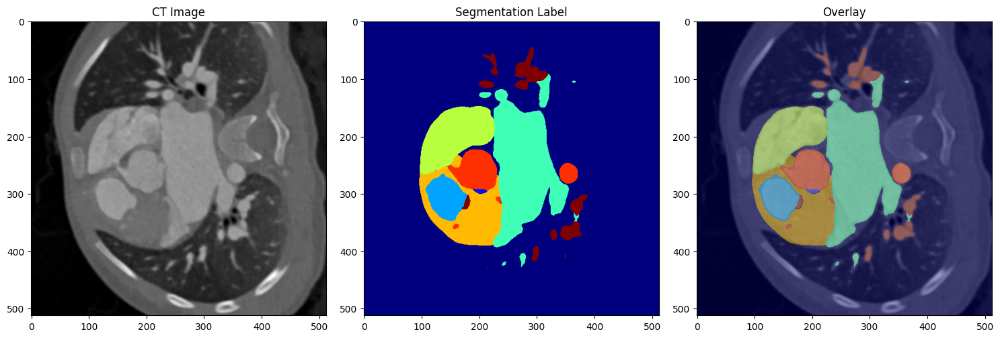

In [ ]:
# Pick the middle slice
slice_idx = img_data.shape[2] // 2

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# CT image
axes[0].imshow(img_data[:, :, slice_idx], cmap='gray')
axes[0].set_title('CT Image')

# Label/mask
axes[1].imshow(label_data[:, :, slice_idx], cmap='jet')
axes[1].set_title('Segmentation Label')

# Overlay
axes[2].imshow(img_data[:, :, slice_idx], cmap='gray')
axes[2].imshow(label_data[:, :, slice_idx], cmap='jet', alpha=0.4)
axes[2].set_title('Overlay')

plt.tight_layout()
plt.show()

**Visualize Multiple Slices of One Scan**

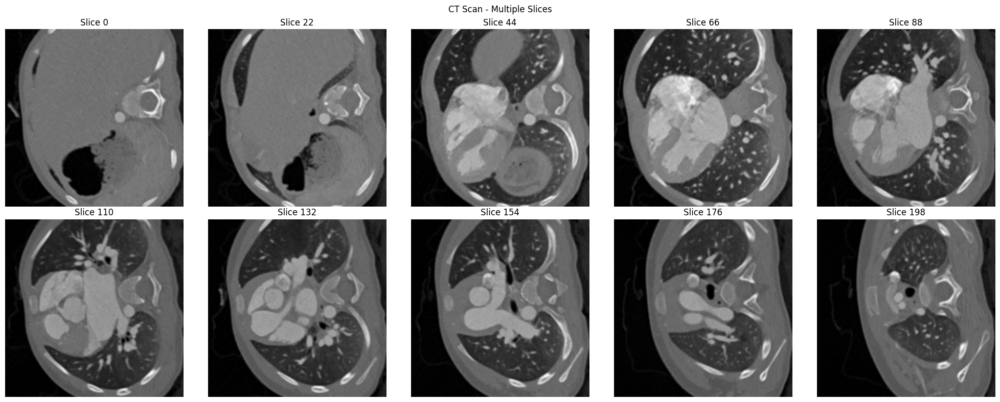

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
total_slices = img_data.shape[2]

for i, ax in enumerate(axes.flat):
    slice_idx = int(total_slices * i / 10)
    ax.imshow(img_data[:, :, slice_idx], cmap='gray')
    ax.set_title(f'Slice {slice_idx}')
    ax.axis('off')

plt.suptitle('CT Scan - Multiple Slices')
plt.tight_layout()
plt.show()

# **Exploratory Data Analysis**

**List & Pair Image/Label Files**

In [ ]:
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict

dataset_path = '/content/ImageCHD_extracted/ImageCHD_dataset'
all_files = os.listdir(dataset_path)

images = sorted([f for f in all_files if 'image' in f])
labels = sorted([f for f in all_files if 'label' in f])

print(f"Total image files: {len(images)}")
print(f"Total label files: {len(labels)}")

# Check for missing pairs
image_ids = set([f.split('_image')[0] for f in images])
label_ids = set([f.split('_label')[0] for f in labels])

missing_labels = image_ids - label_ids
missing_images = label_ids - image_ids

print(f"\n Images without labels: {missing_labels}")
print(f"Labels without images: {missing_images}")

Total image files: 112
Total label files: 110

 Images without labels: {'imageCHD_dataset_info.xlsx', 'imagechd_dataset'}
Labels without images: set()


**Load Diagnosis Info Spreadsheet**

In [ ]:
import pandas as pd

excel_path = os.path.join(dataset_path, 'imageCHD_dataset_info.xlsx')
info_df = pd.read_excel(excel_path)

print(info_df.shape)
print(info_df.head())
print("\nColumns:", info_df.columns.tolist())

(110, 17)
   index  ASD  VSD  AVSD  ToF  TGA  DORV  CAT  CA  AAH  DAA  IAA  PA  APVC  \
0   1001  1.0  1.0   NaN  NaN  NaN   NaN  NaN NaN  NaN  NaN  NaN NaN   NaN   
1   1002  NaN  1.0   NaN  NaN  NaN   NaN  NaN NaN  NaN  NaN  NaN NaN   NaN   
2   1003  NaN  NaN   NaN  NaN  NaN   NaN  NaN NaN  NaN  NaN  NaN NaN   NaN   
3   1004  NaN  NaN   NaN  NaN  NaN   NaN  NaN NaN  NaN  NaN  NaN NaN   1.0   
4   1005  NaN  NaN   NaN  NaN  NaN   NaN  NaN NaN  NaN  NaN  NaN NaN   NaN   

   DSVC  PDA  PAS  
0   NaN  NaN  NaN  
1   NaN  NaN  NaN  
2   NaN  NaN  NaN  
3   NaN  NaN  NaN  
4   NaN  NaN  NaN  

Columns: ['index', 'ASD', 'VSD', 'AVSD', 'ToF', 'TGA', 'DORV', 'CAT', 'CA', 'AAH', 'DAA', 'IAA', 'PA', 'APVC', 'DSVC', 'PDA', 'PAS']


**Diagnosis Frequency Summary**

In [ ]:
print(info_df.iloc[:, 1:].sum().sort_values(ascending=False))
print(f"Normal cases (no diagnosis): {(info_df.iloc[:, 1:].isna().all(axis=1)).sum()}")

VSD     36.0
ASD     32.0
PA      15.0
PDA     13.0
ToF     12.0
DSVC     8.0
CA       7.0
DORV     7.0
APVC     6.0
DAA      5.0
TGA      5.0
CAT      4.0
IAA      3.0
AAH      3.0
PAS      2.0
AVSD     0.0
dtype: float64
Normal cases (no diagnosis): 20


**Image Shape per Scan**

In [ ]:
shapes = []
spacings = []
file_ids = []

# ✅ Only load actual NIfTI image files
images = sorted([f for f in os.listdir(dataset_path) if 'image' in f and f.endswith('.nii.gz')])
labels = sorted([f for f in os.listdir(dataset_path) if 'label' in f and f.endswith('.nii.gz')])

for img_file in images:
    img = nib.load(os.path.join(dataset_path, img_file))
    shapes.append(img.shape)
    spacings.append(img.header.get_zooms())
    file_ids.append(img_file)

df = pd.DataFrame({
    'file': file_ids,
    'shape': shapes,
    'spacing': spacings
})

print("Unique shapes found:")
print(df['shape'].value_counts())

print("\nUnique spacings found:")
print(df['spacing'].value_counts())

if df['shape'].nunique() > 1:
    print("\n ISSUE: Inconsistent image shapes detected!")
else:
    print("\n All images have same shape")

Unique shapes found:
shape
(512, 512, 206)    34
(512, 512, 275)    30
(512, 512, 344)     7
(512, 512, 137)     5
(512, 512, 170)     3
(512, 512, 400)     2
(512, 512, 295)     2
(512, 512, 221)     1
(512, 512, 199)     1
(512, 512, 342)     1
(512, 512, 175)     1
(512, 512, 383)     1
(512, 512, 168)     1
(512, 512, 174)     1
(512, 512, 197)     1
(512, 512, 310)     1
(512, 512, 382)     1
(181, 170, 249)     1
(512, 512, 551)     1
(512, 512, 321)     1
(512, 512, 205)     1
(512, 512, 334)     1
(512, 512, 296)     1
(512, 512, 341)     1
(512, 512, 385)     1
(512, 512, 460)     1
(512, 512, 500)     1
(512, 512, 306)     1
(512, 512, 166)     1
(512, 512, 369)     1
(512, 512, 324)     1
(512, 512, 340)     1
(512, 512, 622)     1
(512, 512, 315)     1
Name: count, dtype: int64

Unique spacings found:
spacing
(1.0, 1.0, 1.0)    110
Name: count, dtype: int64

 ISSUE: Inconsistent image shapes detected!


**Intensity Statistics per Scan**

         min          max         mean         std       median
count  110.0   110.000000   110.000000  110.000000   110.000000
mean     0.0  3918.172727   617.474552  519.459798   538.245455
std      0.0   391.680872   129.801329   33.508846   296.487764
min      0.0  2535.000000   253.143320  351.876180    28.000000
25%      0.0  4095.000000   537.162406  508.139076   330.750000
50%      0.0  4095.000000   608.153375  521.764384   447.000000
75%      0.0  4095.000000   688.160616  538.832983   857.500000
max      0.0  4095.000000  1109.615856  628.868259  1117.000000


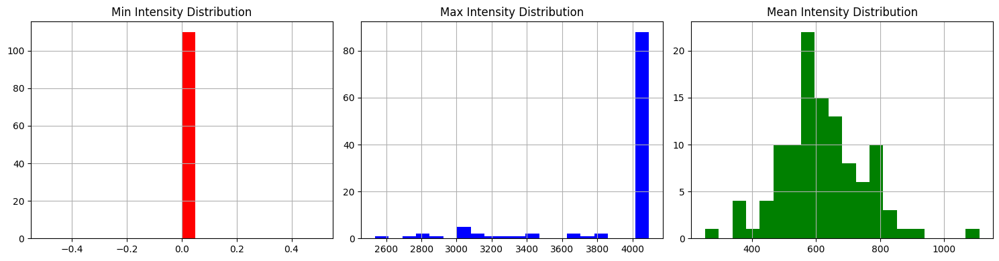

In [ ]:
stats = []

for img_file in images:
    img_data = nib.load(os.path.join(dataset_path, img_file)).get_fdata()
    stats.append({
        'file': img_file,
        'min': img_data.min(),
        'max': img_data.max(),
        'mean': img_data.mean(),
        'std': img_data.std(),
        'median': np.median(img_data)
    })

stats_df = pd.DataFrame(stats)
print(stats_df.describe())

# Plot intensity distributions
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
stats_df['min'].hist(ax=axes[0], bins=20, color='red')
axes[0].set_title('Min Intensity Distribution')

stats_df['max'].hist(ax=axes[1], bins=20, color='blue')
axes[1].set_title('Max Intensity Distribution')

stats_df['mean'].hist(ax=axes[2], bins=20, color='green')
axes[2].set_title('Mean Intensity Distribution')

plt.tight_layout()
plt.show()

**Class Voxel Counts Across All Labels**

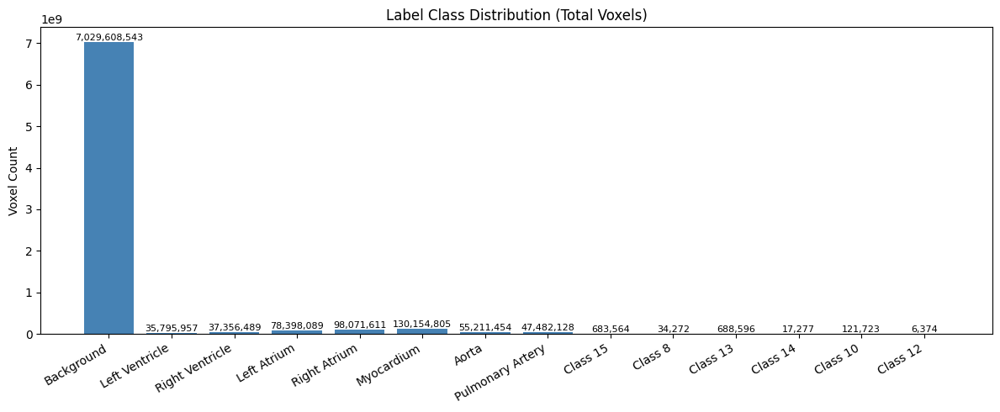

Left Ventricle: 35,795,957 voxels | Ratio vs background: 1:196
Right Ventricle: 37,356,489 voxels | Ratio vs background: 1:188
Left Atrium: 78,398,089 voxels | Ratio vs background: 1:89
Right Atrium: 98,071,611 voxels | Ratio vs background: 1:71
Myocardium: 130,154,805 voxels | Ratio vs background: 1:54
Aorta: 55,211,454 voxels | Ratio vs background: 1:127
Pulmonary Artery: 47,482,128 voxels | Ratio vs background: 1:148
15: 683,564 voxels | Ratio vs background: 1:10283
8: 34,272 voxels | Ratio vs background: 1:205112
13: 688,596 voxels | Ratio vs background: 1:10208
14: 17,277 voxels | Ratio vs background: 1:406876
10: 121,723 voxels | Ratio vs background: 1:57750
12: 6,374 voxels | Ratio vs background: 1:1102856


In [ ]:
# ImageCHD label map
label_names = {
    0: 'Background',
    1: 'Left Ventricle',
    2: 'Right Ventricle',
    3: 'Left Atrium',
    4: 'Right Atrium',
    5: 'Myocardium',
    6: 'Aorta',
    7: 'Pulmonary Artery'
}

label_counts = defaultdict(int)

for lbl_file in labels:
    lbl_data = nib.load(os.path.join(dataset_path, lbl_file)).get_fdata()
    unique, counts = np.unique(lbl_data, return_counts=True)
    for u, c in zip(unique, counts):
        label_counts[int(u)] += c

# Plot class distribution
classes = [label_names.get(k, f'Class {k}') for k in label_counts.keys()]
counts = list(label_counts.values())

plt.figure(figsize=(12, 5))
bars = plt.bar(classes, counts, color='steelblue')
plt.xticks(rotation=30, ha='right')
plt.title('Label Class Distribution (Total Voxels)')
plt.ylabel('Voxel Count')
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
             f'{count:,}', ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

# Class imbalance ratio
bg = label_counts[0]
for k, v in label_counts.items():
    if k != 0:
        print(f"{label_names.get(k, k)}: {v:,} voxels | Ratio vs background: 1:{bg//v}")

**Check for Unknown Label Classes**

In [ ]:
# Find which scans have these unknown classes
unknown_classes = [8, 10, 12, 13, 14, 15]

for lbl_file in labels:
    lbl_data = nib.load(os.path.join(dataset_path, lbl_file)).get_fdata()
    found = [c for c in unknown_classes if c in np.unique(lbl_data)]
    if found:
        print(f"{lbl_file} → has unknown classes: {found}")

ct_1010_label.nii.gz → has unknown classes: [15]
ct_1016_label.nii.gz → has unknown classes: [8]
ct_1032_label.nii.gz → has unknown classes: [15]
ct_1037_label.nii.gz → has unknown classes: [13]
ct_1047_label.nii.gz → has unknown classes: [14]
ct_1050_label.nii.gz → has unknown classes: [15]
ct_1051_label.nii.gz → has unknown classes: [10]
ct_1056_label.nii.gz → has unknown classes: [12]
ct_1080_label.nii.gz → has unknown classes: [12]
ct_1092_label.nii.gz → has unknown classes: [13]
ct_1099_label.nii.gz → has unknown classes: [13]
ct_1101_label.nii.gz → has unknown classes: [14]
ct_1105_label.nii.gz → has unknown classes: [15]
ct_1113_label.nii.gz → has unknown classes: [13]
ct_1117_label.nii.gz → has unknown classes: [13, 15]
ct_1119_label.nii.gz → has unknown classes: [13, 15]
ct_1120_label.nii.gz → has unknown classes: [13, 15]
ct_1122_label.nii.gz → has unknown classes: [13]
ct_1141_label.nii.gz → has unknown classes: [13, 15]
ct_1148_label.nii.gz → has unknown classes: [12]


**Heart Structure Distribution (excluding background)**

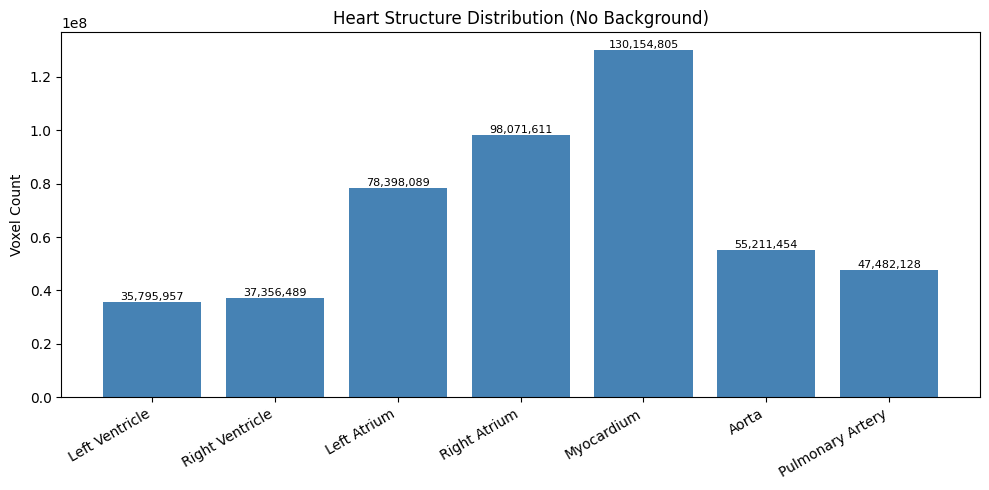

In [ ]:
# Plot WITHOUT background to see heart structures clearly
label_names = {
    1: 'Left Ventricle', 2: 'Right Ventricle',
    3: 'Left Atrium',    4: 'Right Atrium',
    5: 'Myocardium',     6: 'Aorta',
    7: 'Pulmonary Artery'
}

# Remove background (class 0) and unknown classes
known_counts = {label_names[k]: label_counts[k] for k in range(1, 8)}

plt.figure(figsize=(10, 5))
bars = plt.bar(known_counts.keys(), known_counts.values(), color='steelblue')
plt.title('Heart Structure Distribution (No Background)')
plt.ylabel('Voxel Count')
plt.xticks(rotation=30, ha='right')
for bar, val in zip(bars, known_counts.values()):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
             f'{val:,}', ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

**Checking for Corrupt File / Empty Volume**

In [ ]:
corrupt_files = []
empty_labels = []

for img_file in images:
    try:
        img_data = nib.load(os.path.join(dataset_path, img_file)).get_fdata()
        if np.all(img_data == 0):
            empty_labels.append(img_file)
            print(f" Empty image: {img_file}")
    except Exception as e:
        corrupt_files.append(img_file)
        print(f" Corrupt file: {img_file} | Error: {e}")

for lbl_file in labels:
    try:
        lbl_data = nib.load(os.path.join(dataset_path, lbl_file)).get_fdata()
        if np.all(lbl_data == 0):
            empty_labels.append(lbl_file)
            print(f" Empty label: {lbl_file}")
    except Exception as e:
        corrupt_files.append(lbl_file)
        print(f" Corrupt file: {lbl_file} | Error: {e}")

print(f"\nTotal corrupt files: {len(corrupt_files)}")
print(f"Total empty files: {len(empty_labels)}")


Total corrupt files: 0
Total empty files: 0


**Intensity Histograms (First 10 Scans)**

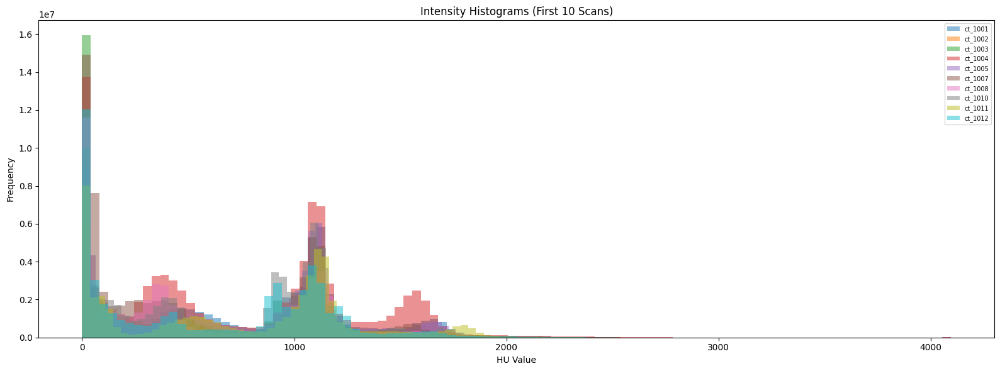

In [ ]:
plt.figure(figsize=(16, 6))

for i, img_file in enumerate(images[:10]):  # first 10 scans
    img_data = nib.load(os.path.join(dataset_path, img_file)).get_fdata().flatten()
    plt.hist(img_data, bins=100, alpha=0.5, label=img_file.split('_image')[0])

plt.title('Intensity Histograms (First 10 Scans)')
plt.xlabel('HU Value')
plt.ylabel('Frequency')
plt.legend(fontsize=7)
plt.tight_layout()
plt.show()

**Visualize a Given Case**

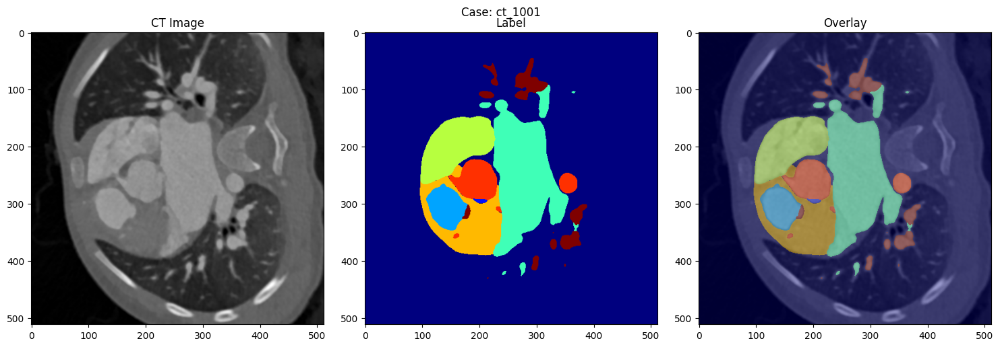

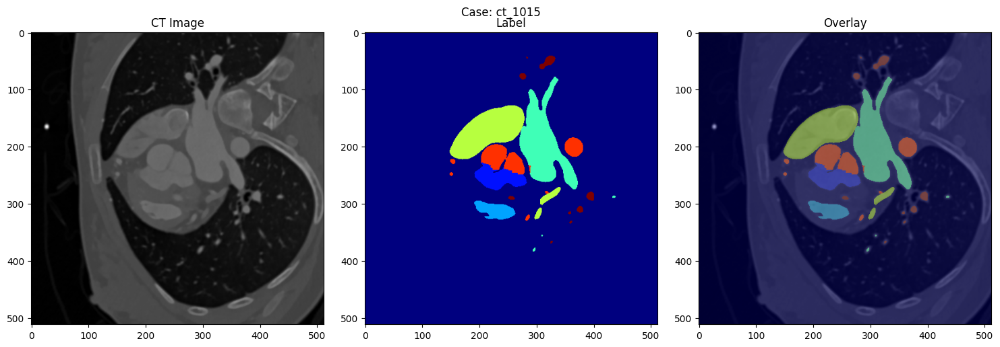

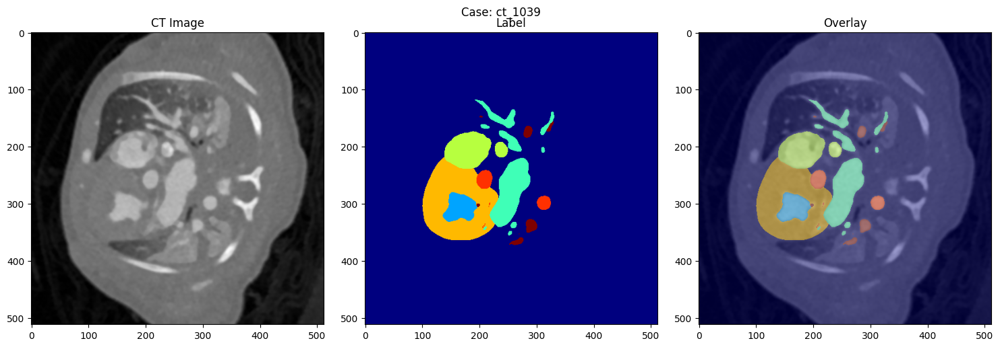

In [ ]:
def visualize_case(case_id):
    img_data = nib.load(os.path.join(dataset_path, f'{case_id}_image.nii.gz')).get_fdata()
    lbl_data = nib.load(os.path.join(dataset_path, f'{case_id}_label.nii.gz')).get_fdata()

    mid = img_data.shape[2] // 2

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img_data[:, :, mid], cmap='gray')
    axes[0].set_title('CT Image')

    axes[1].imshow(lbl_data[:, :, mid], cmap='jet')
    axes[1].set_title('Label')

    axes[2].imshow(img_data[:, :, mid], cmap='gray')
    axes[2].imshow(lbl_data[:, :, mid], cmap='jet', alpha=0.4)
    axes[2].set_title('Overlay')

    plt.suptitle(f'Case: {case_id}')
    plt.tight_layout()
    plt.show()

# Test a few cases
for case in ['ct_1001', 'ct_1015', 'ct_1039']:
    visualize_case(case)

**Map CHD Abbreviations to Full Diagnosis Names**

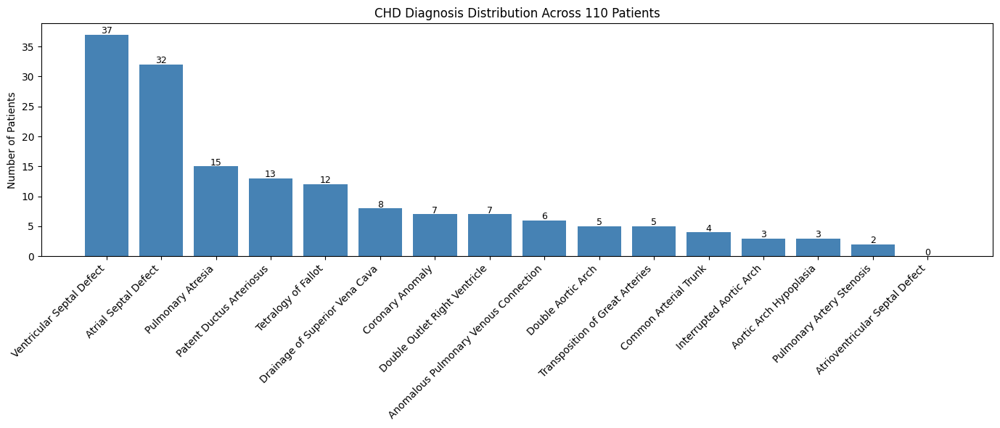

Patients per diagnosis:
Ventricular Septal Defect                37
Atrial Septal Defect                     32
Pulmonary Atresia                        15
Patent Ductus Arteriosus                 13
Tetralogy of Fallot                      12
Drainage of Superior Vena Cava            8
Coronary Anomaly                          7
Double Outlet Right Ventricle             7
Anomalous Pulmonary Venous Connection     6
Double Aortic Arch                        5
Transposition of Great Arteries           5
Common Arterial Trunk                     4
Interrupted Aortic Arch                   3
Aortic Arch Hypoplasia                    3
Pulmonary Artery Stenosis                 2
Atrioventricular Septal Defect            0
dtype: int64

Patients with no marked diagnosis: 20


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

info_df = pd.read_excel(os.path.join(dataset_path, 'imageCHD_dataset_info.xlsx'))

# Full name mapping
chd_names = {
    'ASD': 'Atrial Septal Defect',
    'VSD': 'Ventricular Septal Defect',
    'AVSD': 'Atrioventricular Septal Defect',
    'ToF': 'Tetralogy of Fallot',
    'TGA': 'Transposition of Great Arteries',
    'DORV': 'Double Outlet Right Ventricle',
    'CAT': 'Common Arterial Trunk',
    'CA': 'Coronary Anomaly',
    'AAH': 'Aortic Arch Hypoplasia',
    'DAA': 'Double Aortic Arch',
    'IAA': 'Interrupted Aortic Arch',
    'PA': 'Pulmonary Atresia',
    'APVC': 'Anomalous Pulmonary Venous Connection',
    'DSVC': 'Drainage of Superior Vena Cava',
    'PDA': 'Patent Ductus Arteriosus',
    'PAS': 'Pulmonary Artery Stenosis'
}

# Count each diagnosis
diagnosis_counts = info_df.iloc[:, 1:].notna().sum().sort_values(ascending=False)
diagnosis_counts.index = [chd_names.get(i, i) for i in diagnosis_counts.index]

plt.figure(figsize=(14, 6))
bars = plt.bar(diagnosis_counts.index, diagnosis_counts.values, color='steelblue')
plt.xticks(rotation=45, ha='right')
plt.title('CHD Diagnosis Distribution Across 110 Patients')
plt.ylabel('Number of Patients')
for bar, val in zip(bars, diagnosis_counts.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
             str(val), ha='center', fontsize=9)
plt.tight_layout()
plt.show()

# How many patients have each condition
print("Patients per diagnosis:")
print(diagnosis_counts)

# Normal cases (no diagnosis marked)
normal = (info_df.iloc[:, 1:].isna().all(axis=1)).sum()
print(f"\nPatients with no marked diagnosis: {normal}")

**Diagnosis Co-occurrence Heatmap**

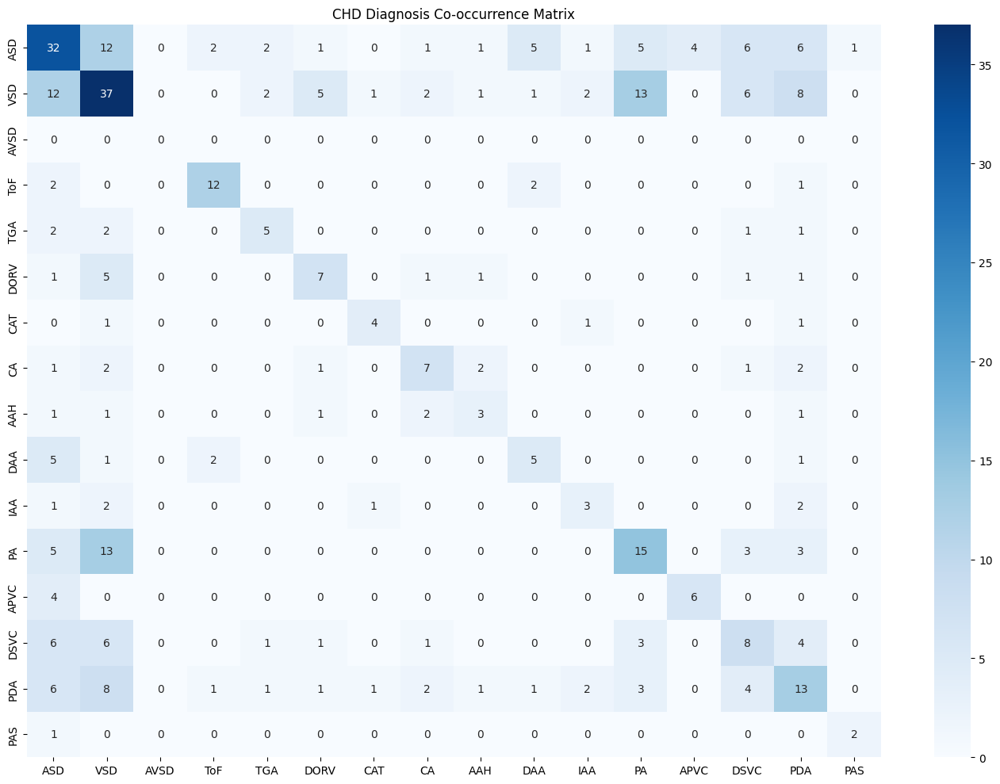

Distribution of diagnoses per patient:
total_diagnoses
0    20
1    52
2    22
3     4
4     9
5     3
Name: count, dtype: int64


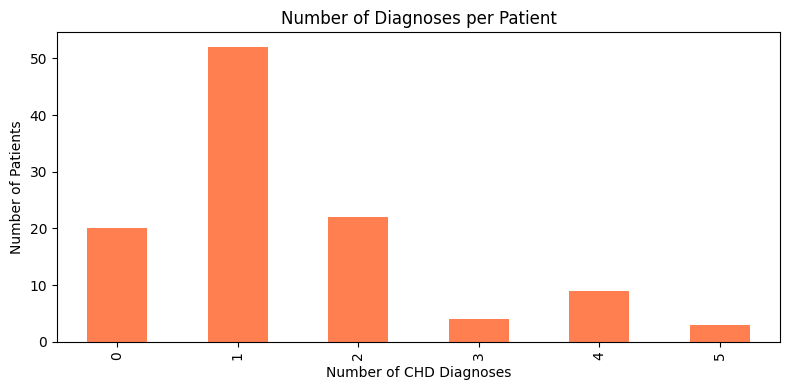

In [ ]:
# Heatmap of co-occurring diagnoses
diag_df = info_df.iloc[:, 1:].notna().astype(int)
cooccurrence = diag_df.T.dot(diag_df)

plt.figure(figsize=(14, 10))
sns.heatmap(cooccurrence, annot=True, fmt='d', cmap='Blues',
            xticklabels=cooccurrence.columns,
            yticklabels=cooccurrence.columns)
plt.title('CHD Diagnosis Co-occurrence Matrix')
plt.tight_layout()
plt.show()

# Patients with multiple diagnoses
diag_df['total_diagnoses'] = diag_df.sum(axis=1)
print("Distribution of diagnoses per patient:")
print(diag_df['total_diagnoses'].value_counts().sort_index())

plt.figure(figsize=(8, 4))
diag_df['total_diagnoses'].value_counts().sort_index().plot(kind='bar', color='coral')
plt.title('Number of Diagnoses per Patient')
plt.xlabel('Number of CHD Diagnoses')
plt.ylabel('Number of Patients')
plt.tight_layout()
plt.show()

**Finding slices that contain heart**

       total_slices  heart_slices  heart_extent  heart_voxels  heart_start  \
count    110.000000    110.000000    110.000000  1.100000e+02   110.000000   
mean     262.563636    227.972727    226.972727  4.400203e+06    22.363636   
std       83.126689     69.631726     69.631726  2.791166e+06    26.503151   
min      137.000000    116.000000    115.000000  1.159051e+06     0.000000   
25%      206.000000    178.750000    177.750000  2.376910e+06     1.000000   
50%      275.000000    205.500000    204.500000  3.816824e+06     9.500000   
75%      295.000000    273.000000    272.000000  5.338201e+06    37.750000   
max      622.000000    467.000000    466.000000  1.451722e+07   134.000000   

        heart_end  
count  110.000000  
mean   249.336364  
std     75.466656  
min    126.000000  
25%    203.000000  
50%    246.500000  
75%    279.250000  
max    529.000000  


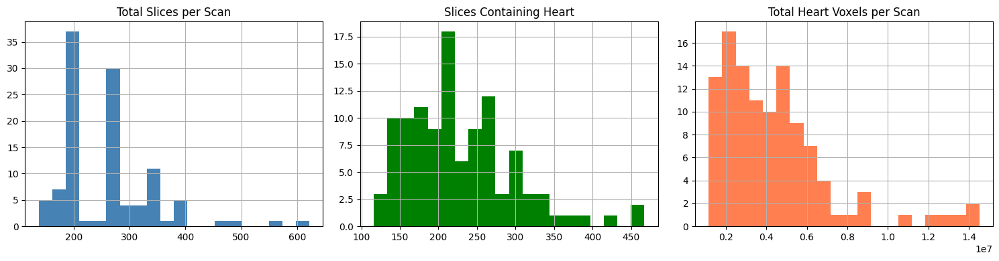

In [ ]:
volumes = []

for lbl_file in labels:
    lbl_data = nib.load(os.path.join(dataset_path, lbl_file)).get_fdata()
    case_id = lbl_file.replace('_label.nii.gz', '')

    # Find slices that contain heart (non-background)
    heart_mask = lbl_data > 0
    heart_slices = np.any(heart_mask, axis=(0, 1))
    first_slice = np.argmax(heart_slices)
    last_slice  = len(heart_slices) - np.argmax(heart_slices[::-1]) - 1
    heart_extent = last_slice - first_slice

    volumes.append({
        'case': case_id,
        'total_slices': lbl_data.shape[2],
        'heart_slices': int(heart_slices.sum()),
        'heart_extent': heart_extent,
        'heart_voxels': int(heart_mask.sum()),
        'heart_start': first_slice,
        'heart_end': last_slice
    })

vol_df = pd.DataFrame(volumes)
print(vol_df.describe())

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
vol_df['total_slices'].hist(ax=axes[0], bins=20, color='steelblue')
axes[0].set_title('Total Slices per Scan')

vol_df['heart_slices'].hist(ax=axes[1], bins=20, color='green')
axes[1].set_title('Slices Containing Heart')

vol_df['heart_voxels'].hist(ax=axes[2], bins=20, color='coral')
axes[2].set_title('Total Heart Voxels per Scan')

plt.tight_layout()
plt.show()

**Visualize 3 Planes (Axial/Sagittal/Coronal)**

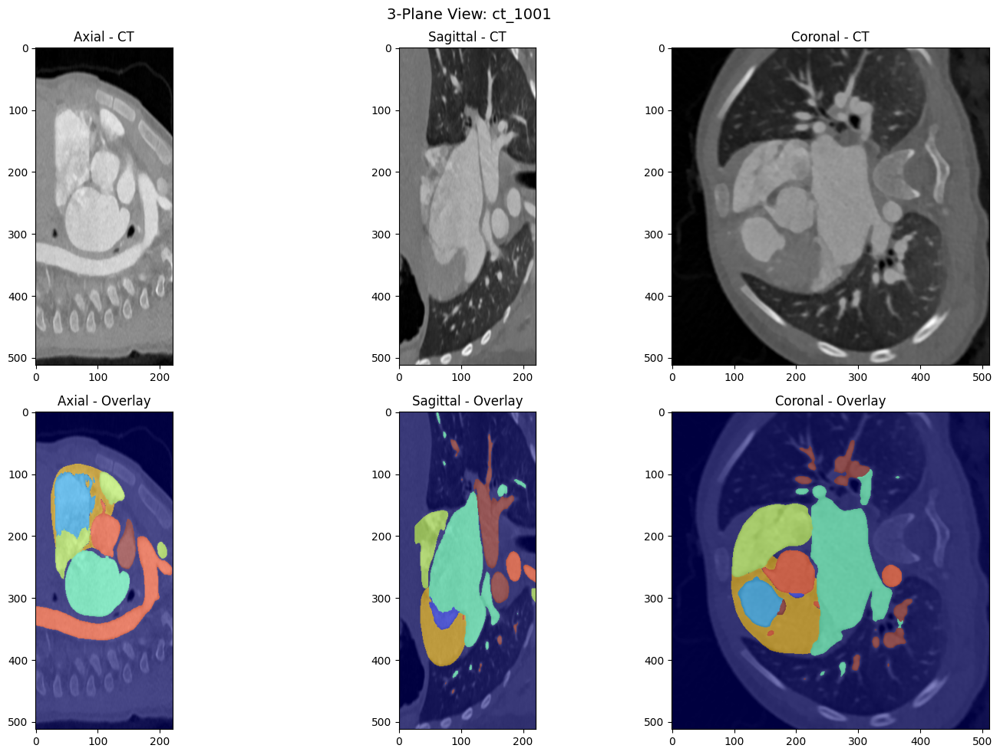

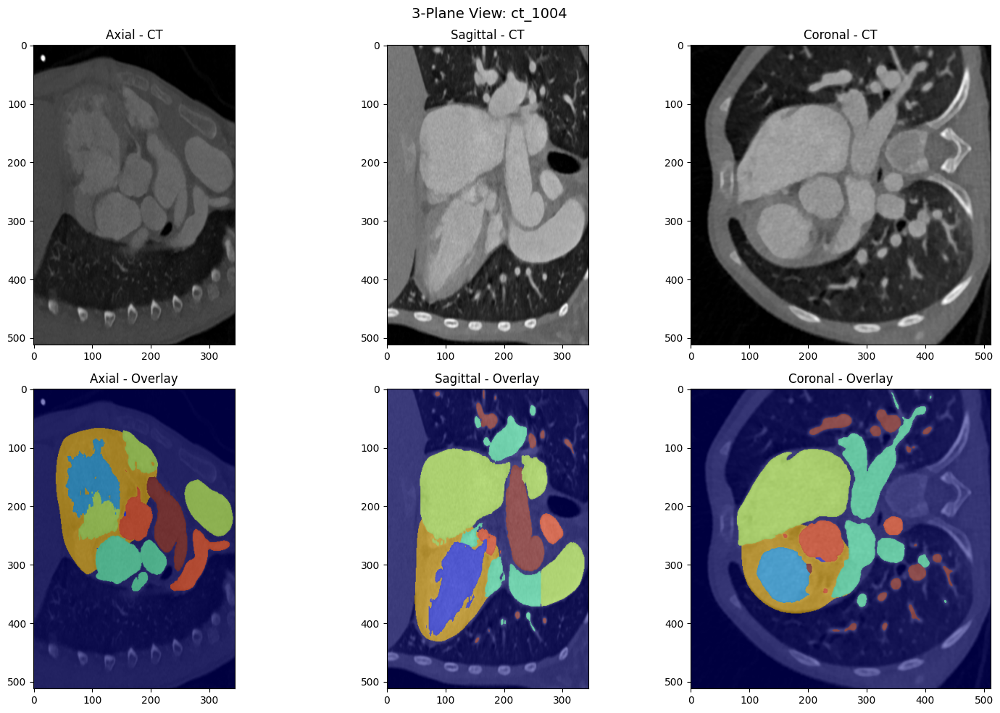

In [ ]:
def visualize_3planes(case_id):
    img_data = nib.load(os.path.join(dataset_path, f'{case_id}_image.nii.gz')).get_fdata()
    lbl_data = nib.load(os.path.join(dataset_path, f'{case_id}_label.nii.gz')).get_fdata()

    # Middle indices for each plane
    ax = img_data.shape[0] // 2  # axial
    sa = img_data.shape[1] // 2  # sagittal
    co = img_data.shape[2] // 2  # coronal

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Row 1: CT image
    axes[0,0].imshow(img_data[ax, :, :], cmap='gray')
    axes[0,0].set_title('Axial - CT')
    axes[0,1].imshow(img_data[:, sa, :], cmap='gray')
    axes[0,1].set_title('Sagittal - CT')
    axes[0,2].imshow(img_data[:, :, co], cmap='gray')
    axes[0,2].set_title('Coronal - CT')

    # Row 2: Labels overlay
    axes[1,0].imshow(img_data[ax, :, :], cmap='gray')
    axes[1,0].imshow(lbl_data[ax, :, :], cmap='jet', alpha=0.5)
    axes[1,0].set_title('Axial - Overlay')
    axes[1,1].imshow(img_data[:, sa, :], cmap='gray')
    axes[1,1].imshow(lbl_data[:, sa, :], cmap='jet', alpha=0.5)
    axes[1,1].set_title('Sagittal - Overlay')
    axes[1,2].imshow(img_data[:, :, co], cmap='gray')
    axes[1,2].imshow(lbl_data[:, :, co], cmap='jet', alpha=0.5)
    axes[1,2].set_title('Coronal - Overlay')

    plt.suptitle(f'3-Plane View: {case_id}', fontsize=14)
    plt.tight_layout()
    plt.show()

visualize_3planes('ct_1001')
visualize_3planes('ct_1004')  # The outlier scan

**Boxplot: Structure Size Variation Across Cases**

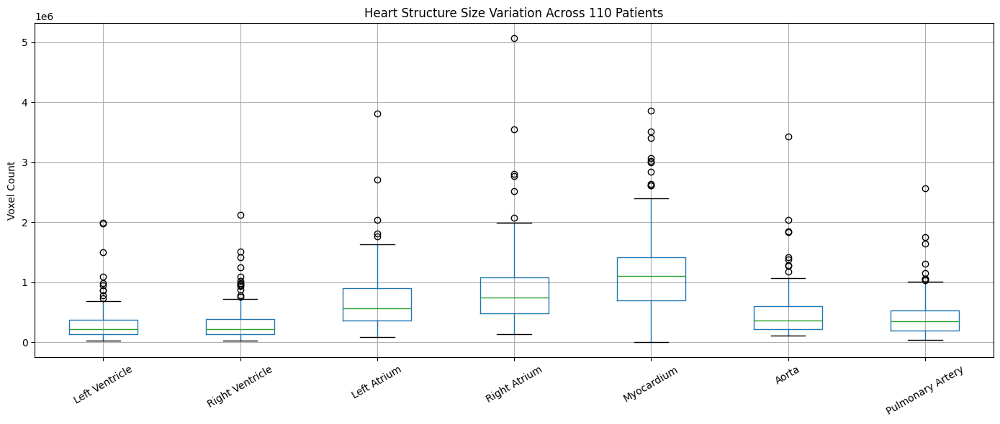


⚠️ Left Ventricle outliers:
         Left Ventricle
ct_1015         1090780
ct_1056         1503245
ct_1080         1992607
ct_1083         1976226

⚠️ Right Ventricle outliers:
         Right Ventricle
ct_1004          1514382
ct_1015          1094208
ct_1056          2125399
ct_1083          1416674
ct_1135          1242635

⚠️ Left Atrium outliers:
         Left Atrium
ct_1005      1808564
ct_1083      3806577
ct_1121      2036560
ct_1132      2705164

⚠️ Right Atrium outliers:
         Right Atrium
ct_1004       5060546
ct_1023       2797855
ct_1037       2515516
ct_1121       2773108
ct_1132       3540417

⚠️ Myocardium outliers:
         Myocardium
ct_1004     3067116
ct_1037     3514480
ct_1056     3861247
ct_1083     2833696
ct_1121     2989039
ct_1129     3013684
ct_1132     3397841

⚠️ Aorta outliers:
           Aorta
ct_1037  2037343
ct_1132  1830476
ct_1141  1843802
ct_1161  3422881

⚠️ Pulmonary Artery outliers:
         Pulmonary Artery
ct_1004           1751648
ct_1083 

In [ ]:
structure_sizes = {name: [] for name in label_names.values()}
case_ids = []

for lbl_file in labels:
    lbl_data = nib.load(os.path.join(dataset_path, lbl_file)).get_fdata()
    case_ids.append(lbl_file.replace('_label.nii.gz', ''))
    for cls_id, cls_name in label_names.items():
        size = int((lbl_data == cls_id).sum())
        structure_sizes[cls_name].append(size)

size_df = pd.DataFrame(structure_sizes, index=case_ids)

# Boxplot — size variation per structure
plt.figure(figsize=(14, 6))
size_df.boxplot(rot=30)
plt.title('Heart Structure Size Variation Across 110 Patients')
plt.ylabel('Voxel Count')
plt.tight_layout()
plt.show()

# Which patients have unusually small/large structures?
for col in size_df.columns:
    mean, std = size_df[col].mean(), size_df[col].std()
    outliers = size_df[(size_df[col] < mean - 2*std) | (size_df[col] > mean + 2*std)]
    if len(outliers) > 0:
        print(f"\n⚠️ {col} outliers:")
        print(outliers[[col]])

# **More Detailed EDA**

Total image files: 110
Total label files: 110


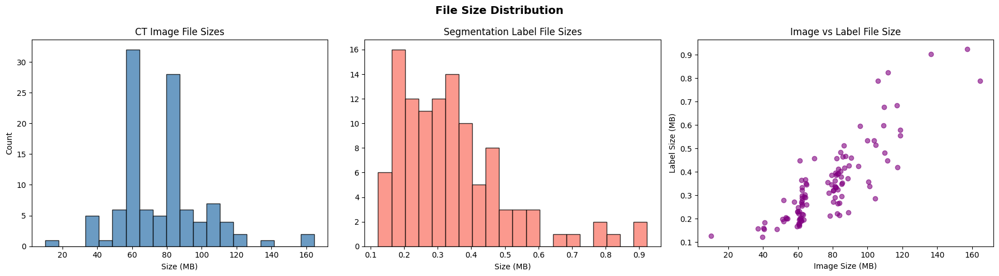

       image_size_MB  label_size_MB
count     110.000000     110.000000
mean       77.200351       0.345690
std        23.766779       0.164019
min        10.152923       0.122529
25%        61.582259       0.220210
50%        79.364735       0.320940
75%        86.263434       0.415782
max       164.569227       0.923491


In [ ]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from glob import glob

# Set your dataset path
dataset_path = "/content/ImageCHD_extracted/ImageCHD_dataset"  # <-- update this

# Gather all image and label files
image_files = sorted(glob(os.path.join(dataset_path, '*_image.nii.gz')))
label_files  = sorted(glob(os.path.join(dataset_path, '*_label.nii.gz')))

print(f"Total image files: {len(image_files)}")
print(f"Total label files: {len(label_files)}")

# File sizes
img_sizes  = [os.path.getsize(f) / (1024**2) for f in image_files]   # MB
lbl_sizes  = [os.path.getsize(f) / (1024**2) for f in label_files]

patient_ids = [os.path.basename(f).split('_image')[0] for f in image_files]

df_files = pd.DataFrame({
    'patient_id': patient_ids,
    'image_size_MB': img_sizes,
    'label_size_MB': lbl_sizes
})

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(img_sizes,  bins=20, color='steelblue',  edgecolor='k', alpha=0.8)
axes[0].set_title('CT Image File Sizes')
axes[0].set_xlabel('Size (MB)')
axes[0].set_ylabel('Count')

axes[1].hist(lbl_sizes, bins=20, color='salmon', edgecolor='k', alpha=0.8)
axes[1].set_title('Segmentation Label File Sizes')
axes[1].set_xlabel('Size (MB)')

axes[2].scatter(img_sizes, lbl_sizes, alpha=0.6, color='purple')
axes[2].set_title('Image vs Label File Size')axes[2].set_xlabel('Image Size (MB)')
axes[2].set_ylabel('Label Size (MB)')

plt.suptitle('File Size Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(df_files.describe())

**Image Dimensions & Voxel Spacing Analysis**

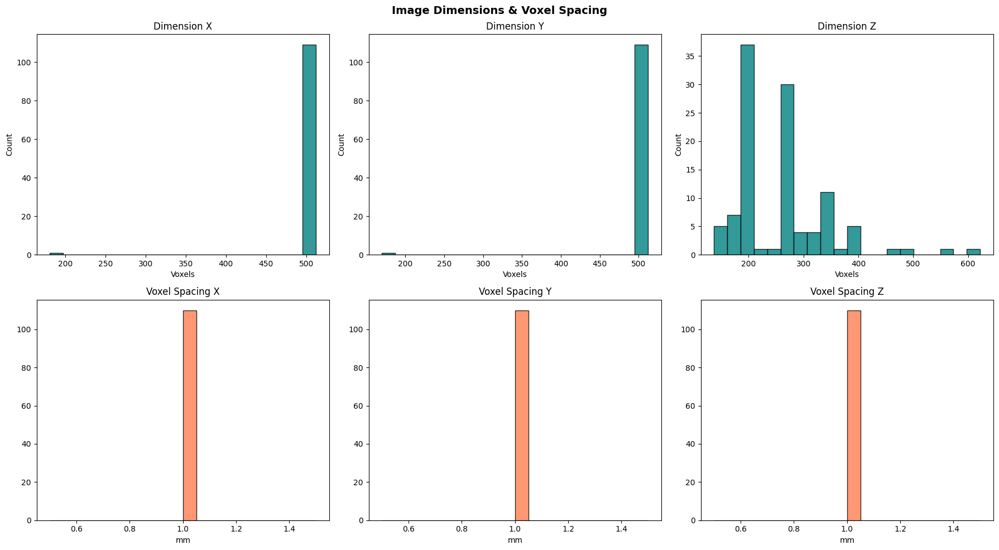

            dim_x       dim_y       dim_z   sp_x   sp_y   sp_z
count  110.000000  110.000000  110.000000  110.0  110.0  110.0
mean   508.990909  508.890909  262.563636    1.0    1.0    1.0
std     31.559612   32.608421   83.126689    0.0    0.0    0.0
min    181.000000  170.000000  137.000000    1.0    1.0    1.0
25%    512.000000  512.000000  206.000000    1.0    1.0    1.0
50%    512.000000  512.000000  275.000000    1.0    1.0    1.0
75%    512.000000  512.000000  295.000000    1.0    1.0    1.0
max    512.000000  512.000000  622.000000    1.0    1.0    1.0


In [ ]:
dims_list    = []
spacing_list = []

for f in image_files:
    nii = nib.load(f)
    shape  = nii.shape          # (X, Y, Z)
    header = nii.header
    zooms  = header.get_zooms() # (sp_x, sp_y, sp_z)
    dims_list.append(shape[:3])
    spacing_list.append(zooms[:3])

dims_arr    = np.array(dims_list)
spacing_arr = np.array(spacing_list)

df_meta = pd.DataFrame({
    'patient_id': patient_ids,
    'dim_x': dims_arr[:, 0],
    'dim_y': dims_arr[:, 1],
    'dim_z': dims_arr[:, 2],
    'sp_x':  spacing_arr[:, 0],
    'sp_y':  spacing_arr[:, 1],
    'sp_z':  spacing_arr[:, 2],
})

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for idx, col in enumerate(['dim_x', 'dim_y', 'dim_z']):
    axes[0, idx].hist(df_meta[col], bins=20, color='teal', edgecolor='k', alpha=0.8)
    axes[0, idx].set_title(f'Dimension {col.split("_")[1].upper()}')
    axes[0, idx].set_xlabel('Voxels')
    axes[0, idx].set_ylabel('Count')

for idx, col in enumerate(['sp_x', 'sp_y', 'sp_z']):
    axes[1, idx].hist(df_meta[col], bins=20, color='coral', edgecolor='k', alpha=0.8)
    axes[1, idx].set_title(f'Voxel Spacing {col.split("_")[1].upper()}')
    axes[1, idx].set_xlabel('mm')

plt.suptitle('Image Dimensions & Voxel Spacing', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(df_meta.describe())

**Voxel Spacing: In-plane vs Through-plane Comparison**

/tmp/ipykernel_1126/600958416.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot([df_meta['sp_x'], df_meta['sp_y'], df_meta['sp_z']],


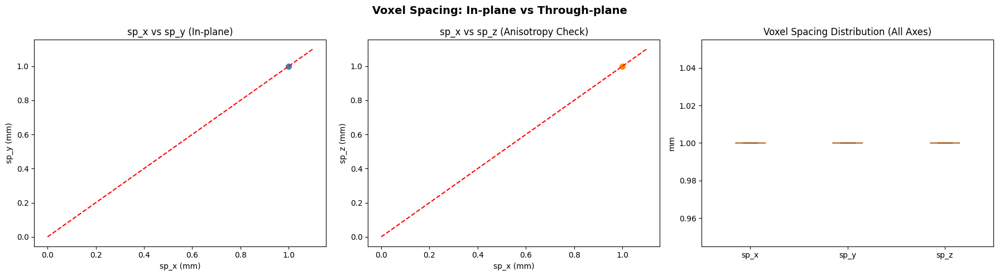

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# X vs Y spacing (should be ~isotropic)
axes[0].scatter(df_meta['sp_x'], df_meta['sp_y'], alpha=0.6, color='steelblue')
lim = max(df_meta['sp_x'].max(), df_meta['sp_y'].max()) * 1.1
axes[0].plot([0, lim], [0, lim], 'r--')
axes[0].set_title('sp_x vs sp_y (In-plane)')
axes[0].set_xlabel('sp_x (mm)')
axes[0].set_ylabel('sp_y (mm)')

# X vs Z (anisotropy check)
axes[1].scatter(df_meta['sp_x'], df_meta['sp_z'], alpha=0.6, color='darkorange')
lim2 = max(df_meta['sp_x'].max(), df_meta['sp_z'].max()) * 1.1
axes[1].plot([0, lim2], [0, lim2], 'r--')
axes[1].set_title('sp_x vs sp_z (Anisotropy Check)')
axes[1].set_xlabel('sp_x (mm)')
axes[1].set_ylabel('sp_z (mm)')

# Boxplot all three
axes[2].boxplot([df_meta['sp_x'], df_meta['sp_y'], df_meta['sp_z']],
                labels=['sp_x', 'sp_y', 'sp_z'])
axes[2].set_title('Voxel Spacing Distribution (All Axes)')
axes[2].set_ylabel('mm')

plt.suptitle('Voxel Spacing: In-plane vs Through-plane', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**Voxel Intensity Analysis**

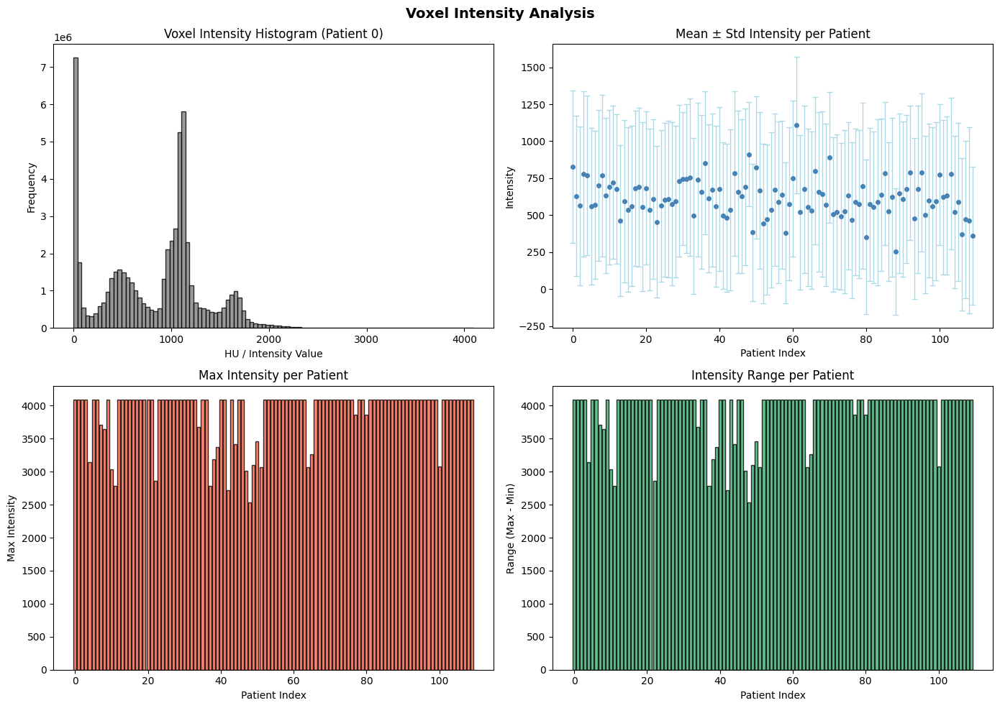

In [ ]:
means, stds, maxvals, ranges = [], [], [], []

for f in image_files:
    data = nib.load(f).get_fdata()
    means.append(data.mean())
    stds.append(data.std())
    maxvals.append(data.max())
    ranges.append(data.max() - data.min())

# Global intensity histogram (sample one patient for speed)
sample_data = nib.load(image_files[0]).get_fdata().flatten()

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].hist(sample_data, bins=100, color='gray', edgecolor='k', alpha=0.8)
axes[0, 0].set_title('Voxel Intensity Histogram (Patient 0)')
axes[0, 0].set_xlabel('HU / Intensity Value')
axes[0, 0].set_ylabel('Frequency')

x = range(len(means))
axes[0, 1].errorbar(x, means, yerr=stds, fmt='o', color='steelblue',
                    ecolor='lightblue', elinewidth=1, capsize=3, markersize=4)
axes[0, 1].set_title('Mean ± Std Intensity per Patient')
axes[0, 1].set_xlabel('Patient Index')
axes[0, 1].set_ylabel('Intensity')

axes[1, 0].bar(x, maxvals, color='tomato', edgecolor='k', alpha=0.8)
axes[1, 0].set_title('Max Intensity per Patient')
axes[1, 0].set_xlabel('Patient Index')
axes[1, 0].set_ylabel('Max Intensity')

axes[1, 1].bar(x, ranges, color='mediumseagreen', edgecolor='k', alpha=0.8)
axes[1, 1].set_title('Intensity Range per Patient')
axes[1, 1].set_xlabel('Patient Index')
axes[1, 1].set_ylabel('Range (Max - Min)')

plt.suptitle('Voxel Intensity Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**Multi-planar Visualization (Axial, Coronal, Sagittal)**

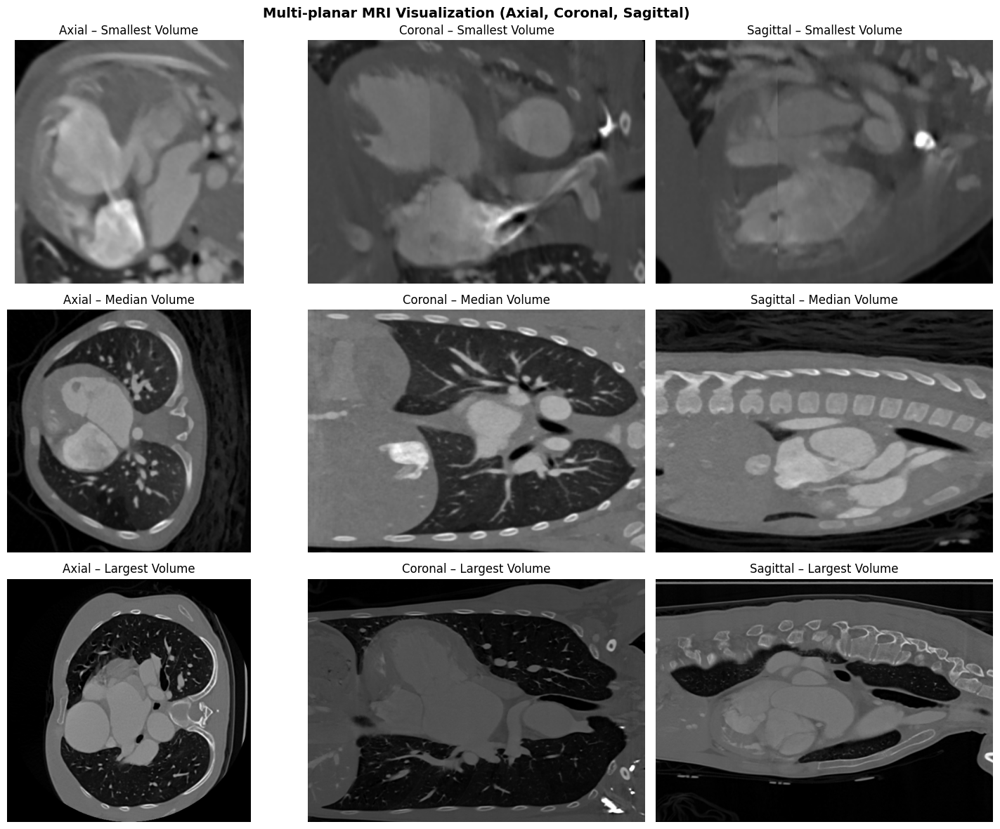

In [ ]:
# Pick 3 patients: smallest, median, largest volume
volumes = [d[0]*d[1]*d[2] for d in dims_list]
sorted_idx = np.argsort(volumes)
selected = [sorted_idx[0], sorted_idx[len(sorted_idx)//2], sorted_idx[-1]]
labels_titles = ['Smallest Volume', 'Median Volume', 'Largest Volume']

fig, axes = plt.subplots(3, 3, figsize=(15, 12))

for row, (pid, title) in enumerate(zip(selected, labels_titles)):
    data = nib.load(image_files[pid]).get_fdata()
    mid_x = data.shape[0] // 2
    mid_y = data.shape[1] // 2
    mid_z = data.shape[2] // 2

    axes[row, 0].imshow(data[:, :, mid_z], cmap='gray', origin='lower')
    axes[row, 0].set_title(f'Axial – {title}')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(data[:, mid_y, :], cmap='gray', origin='lower', aspect='auto')
    axes[row, 1].set_title(f'Coronal – {title}')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(data[mid_x, :, :], cmap='gray', origin='lower', aspect='auto')
    axes[row, 2].set_title(f'Sagittal – {title}')
    axes[row, 2].axis('off')

plt.suptitle('Multi-planar MRI Visualization (Axial, Coronal, Sagittal)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**Raw Image with Segmentation Overlay (Multi-plane)**

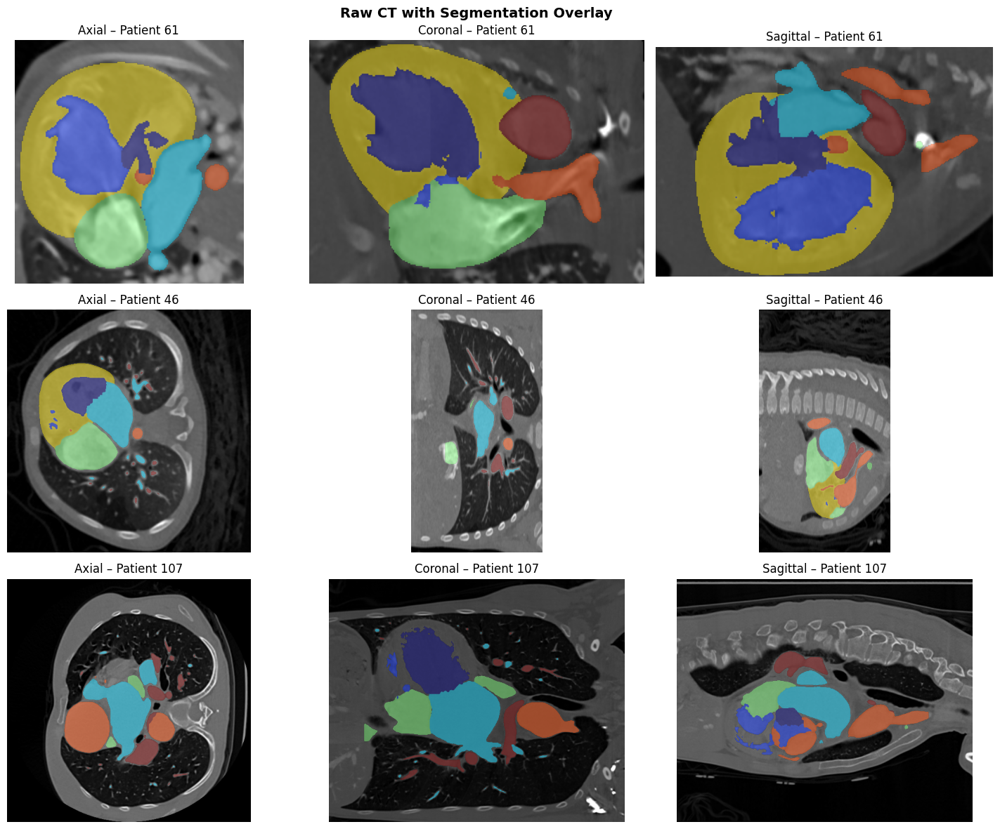

In [ ]:
# imageCHD label map – update if your labels differ
LABEL_NAMES = {
    1: 'LV', 2: 'RV', 3: 'LA', 4: 'RA',
    5: 'MYO', 6: 'AO', 7: 'PA'
}

fig, axes = plt.subplots(3, 3, figsize=(15, 12))

for row, pid in enumerate(selected):
    img_data = nib.load(image_files[pid]).get_fdata()
    lbl_data = nib.load(label_files[pid]).get_fdata()

    mid_z = img_data.shape[2] // 2
    mid_y = img_data.shape[1] // 2
    mid_x = img_data.shape[0] // 2

    views = [
        (img_data[:, :, mid_z], lbl_data[:, :, mid_z], 'Axial'),
        (img_data[:, mid_y, :], lbl_data[:, mid_y, :], 'Coronal'),
        (img_data[mid_x, :, :], lbl_data[mid_x, :, :], 'Sagittal'),
    ]

    for col, (img_sl, lbl_sl, view_name) in enumerate(views):
        axes[row, col].imshow(img_sl, cmap='gray', origin='lower')
        axes[row, col].imshow(np.ma.masked_where(lbl_sl == 0, lbl_sl),
                              cmap='jet', alpha=0.45, origin='lower',
                              vmin=1, vmax=max(LABEL_NAMES.keys()))
        axes[row, col].set_title(f'{view_name} – Patient {pid}')
        axes[row, col].axis('off')

plt.suptitle('Raw CT with Segmentation Overlay', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**All Patients: Middle Axial Slice Grid**

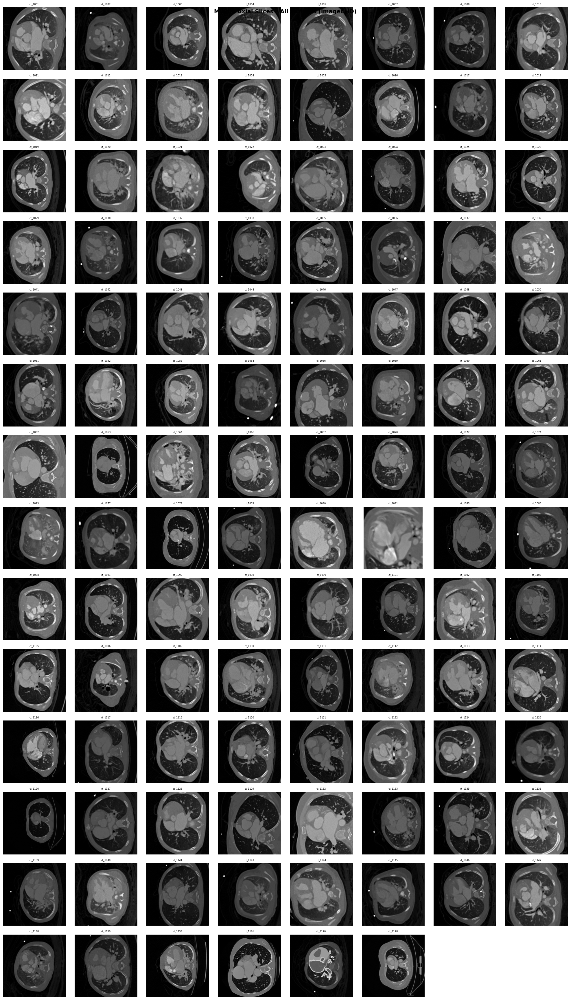

In [ ]:
n = len(image_files)
cols = 8
rows = int(np.ceil(n / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols * 2.5, rows * 2.5))
axes = axes.flatten()

for i, f in enumerate(image_files):
    data = nib.load(f).get_fdata()
    mid_z = data.shape[2] // 2
    axes[i].imshow(data[:, :, mid_z], cmap='gray', origin='lower')
    axes[i].set_title(patient_ids[i], fontsize=6)
    axes[i].axis('off')

# Hide unused axes
for j in range(n, len(axes)):
    axes[j].axis('off')

plt.suptitle('Middle Axial Slices – All Patients (imageCHD)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**All Patients: Middle Axial Slice with Segmentation Overlay Grid**

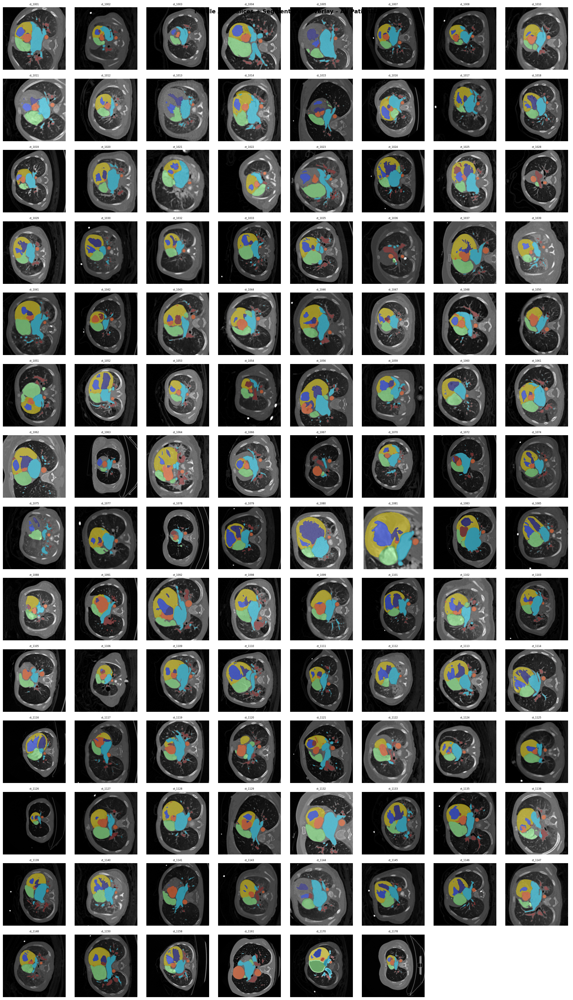

In [ ]:
fig, axes = plt.subplots(rows, cols, figsize=(cols * 2.5, rows * 2.5))
axes = axes.flatten()

for i, (img_f, lbl_f) in enumerate(zip(image_files, label_files)):
    img_d = nib.load(img_f).get_fdata()
    lbl_d = nib.load(lbl_f).get_fdata()
    mid_z = img_d.shape[2] // 2
    axes[i].imshow(img_d[:, :, mid_z], cmap='gray', origin='lower')
    axes[i].imshow(np.ma.masked_where(lbl_d[:, :, mid_z] == 0, lbl_d[:, :, mid_z]),
                   cmap='jet', alpha=0.45, origin='lower',
                   vmin=1, vmax=max(LABEL_NAMES.keys()))
    axes[i].set_title(patient_ids[i], fontsize=6)
    axes[i].axis('off')

for j in range(n, len(axes)):
    axes[j].axis('off')

plt.suptitle('Middle Axial Slices + Segmentation Overlay – All Patients',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**Voxel Class Distribution (Class Imbalance Analysis)**

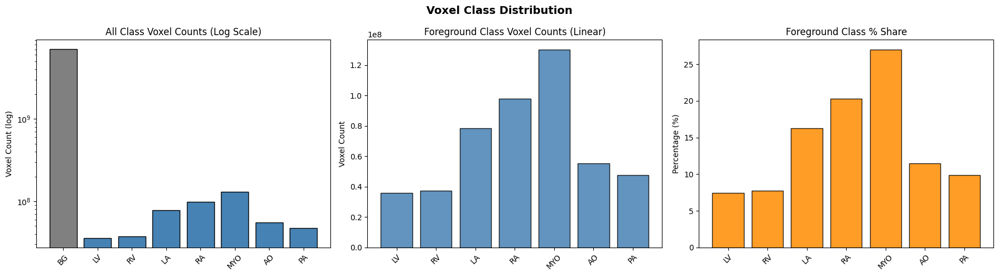

In [ ]:
label_ids   = sorted(LABEL_NAMES.keys())
all_labels  = list(LABEL_NAMES.values())
counts_all  = {k: 0 for k in [0] + label_ids}

for lbl_f in label_files:
    lbl_d = nib.load(lbl_f).get_fdata().astype(int)
    unique, cnts = np.unique(lbl_d, return_counts=True)
    for u, c in zip(unique, cnts):
        if u in counts_all:
            counts_all[u] += c

fg_counts  = {k: counts_all[k] for k in label_ids}
total_fg   = sum(fg_counts.values())
pct_counts = {k: v / total_fg * 100 for k, v in fg_counts.items()}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# All classes (log scale)
all_keys = [0] + label_ids
all_vals = [counts_all[k] for k in all_keys]
all_lbls = ['BG'] + all_labels
axes[0].bar(all_lbls, all_vals, color=['gray'] + ['steelblue'] * len(label_ids), edgecolor='k')
axes[0].set_yscale('log')
axes[0].set_title('All Class Voxel Counts (Log Scale)')
axes[0].set_ylabel('Voxel Count (log)')
axes[0].tick_params(axis='x', rotation=45)

# Foreground only (linear)
axes[1].bar(all_labels, [fg_counts[k] for k in label_ids],
            color='steelblue', edgecolor='k', alpha=0.85)
axes[1].set_title('Foreground Class Voxel Counts (Linear)')
axes[1].set_ylabel('Voxel Count')
axes[1].tick_params(axis='x', rotation=45)

# Percentage share
axes[2].bar(all_labels, [pct_counts[k] for k in label_ids],
            color='darkorange', edgecolor='k', alpha=0.85)
axes[2].set_title('Foreground Class % Share')
axes[2].set_ylabel('Percentage (%)')
axes[2].tick_params(axis='x', rotation=45)

plt.suptitle('Voxel Class Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**Structure Presence / Absence Analysis**

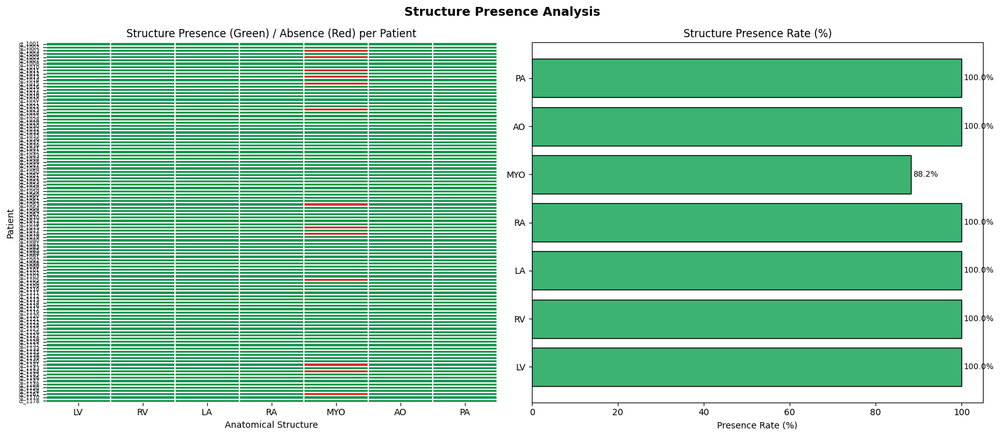

LV     110
RV     110
LA     110
RA     110
MYO     97
AO     110
PA     110
dtype: int64


In [ ]:
import seaborn as sns

presence_matrix = []

for lbl_f in label_files:
    lbl_d = nib.load(lbl_f).get_fdata().astype(int)
    unique_lbls = set(np.unique(lbl_d))
    row = [1 if k in unique_lbls else 0 for k in label_ids]
    presence_matrix.append(row)

df_presence = pd.DataFrame(presence_matrix, columns=all_labels, index=patient_ids)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Heatmap (green = present, red = absent)
cmap = sns.color_palette(["#d73027", "#1a9850"], as_cmap=False)
sns.heatmap(df_presence, ax=axes[0], cmap=["#d73027", "#1a9850"],
            linewidths=0.3, linecolor='white', cbar=False,
            yticklabels=True, xticklabels=True)
axes[0].set_title('Structure Presence (Green) / Absence (Red) per Patient')
axes[0].set_xlabel('Anatomical Structure')
axes[0].set_ylabel('Patient')
axes[0].tick_params(axis='y', labelsize=6)

# Presence rate bar chart
presence_rate = df_presence.mean() * 100
axes[1].barh(all_labels, presence_rate, color='mediumseagreen', edgecolor='k')
axes[1].set_xlim(0, 105)
axes[1].set_title('Structure Presence Rate (%)')
axes[1].set_xlabel('Presence Rate (%)')
for i, v in enumerate(presence_rate):
    axes[1].text(v + 0.5, i, f'{v:.1f}%', va='center', fontsize=9)

plt.suptitle('Structure Presence Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(df_presence.sum())

**Physical Volume Distribution of Cardiac Structures**

/tmp/ipykernel_1126/222560376.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[0].boxplot(data_box, labels=all_labels, patch_artist=True, notch=False)


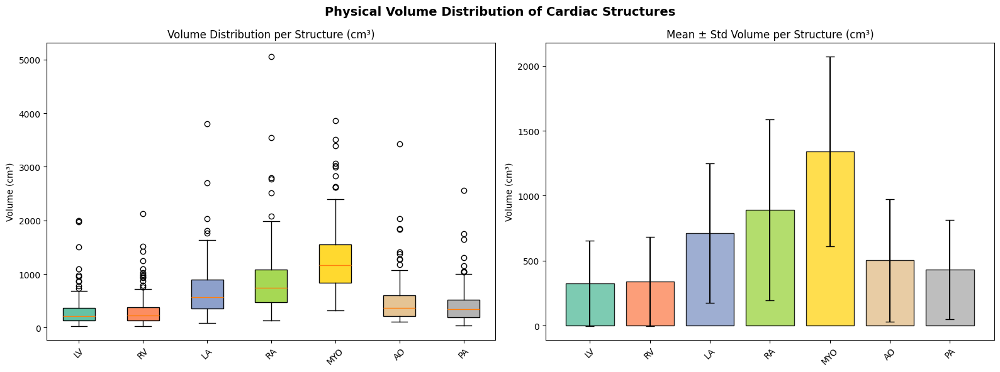

In [ ]:
vol_data = {name: [] for name in all_labels}

for i, lbl_f in enumerate(label_files):
    lbl_d  = nib.load(lbl_f).get_fdata().astype(int)
    vox_vol = np.prod(spacing_arr[i])   # mm³ per voxel
    for k, name in zip(label_ids, all_labels):
        cnt = np.sum(lbl_d == k)
        if cnt > 0:
            vol_data[name].append(cnt * vox_vol / 1000.0)  # cm³

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Boxplot
data_box   = [vol_data[name] for name in all_labels]
bp = axes[0].boxplot(data_box, labels=all_labels, patch_artist=True, notch=False)
colors = plt.cm.Set2(np.linspace(0, 1, len(all_labels)))
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_title('Volume Distribution per Structure (cm³)')
axes[0].set_ylabel('Volume (cm³)')
axes[0].tick_params(axis='x', rotation=45)

# Mean ± Std bar chart
means_vol = [np.mean(vol_data[n]) if vol_data[n] else 0 for n in all_labels]
stds_vol  = [np.std(vol_data[n])  if vol_data[n] else 0 for n in all_labels]
axes[1].bar(all_labels, means_vol, yerr=stds_vol, capsize=5,
            color=colors, edgecolor='k', alpha=0.85)
axes[1].set_title('Mean ± Std Volume per Structure (cm³)')
axes[1].set_ylabel('Volume (cm³)')
axes[1].tick_params(axis='x', rotation=45)

plt.suptitle('Physical Volume Distribution of Cardiac Structures',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

**Stacked Voxel Distribution Across Patients (Class Contributions)**

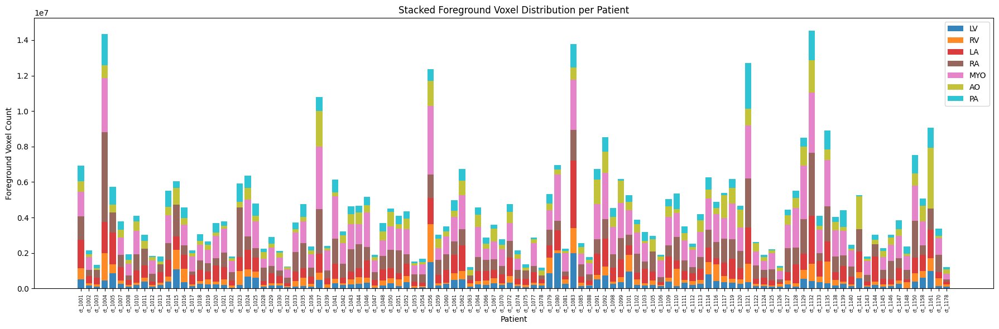

In [ ]:
per_patient_counts = []

for lbl_f in label_files:
    lbl_d = nib.load(lbl_f).get_fdata().astype(int)
    row   = [np.sum(lbl_d == k) for k in label_ids]
    per_patient_counts.append(row)

df_counts = pd.DataFrame(per_patient_counts, columns=all_labels, index=patient_ids)

fig, ax = plt.subplots(figsize=(18, 6))

bottom = np.zeros(len(df_counts))
colors = plt.cm.tab10(np.linspace(0, 1, len(all_labels)))

for col, color in zip(all_labels, colors):
    ax.bar(range(len(df_counts)), df_counts[col], bottom=bottom,
           label=col, color=color, edgecolor='none', alpha=0.9)
    bottom += df_counts[col].values

ax.set_xticks(range(len(df_counts)))
ax.set_xticklabels(patient_ids, rotation=90, fontsize=6)
ax.set_xlabel('Patient')
ax.set_ylabel('Foreground Voxel Count')
ax.set_title('Stacked Foreground Voxel Distribution per Patient')
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()